# Concord analysis of kidney

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import Concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

In [6]:
proj_name = "kidney_GSE151302"
save_dir = f"../save/dev_{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/McMahon_kidney/GSE151302/"
data_dir = Path(data_dir)
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cuda:3


'Dec05-0924'

In [7]:
import os
import scanpy as sc
import pandas as pd

# Initialize a list to store AnnData objects
adata_list = []

# Iterate over each file
for filename in os.listdir(data_dir):
    if filename.endswith("_filtered_feature_bc_matrix.h5"):
        # Parse the sample name from the filename
        sample = filename.split("_")[0]  # e.g., 'GSM4572192' becomes 'Control1'

        # Path to the file
        file_path = os.path.join(data_dir, filename)

        # Read the data
        adata = sc.read_10x_h5(file_path)

        # Ensure var_names are unique
        adata.var_names_make_unique()

        # Add metadata to adata.obs
        adata.obs["sample"] = sample

        # Ensure unique obs_names
        adata.obs_names = [f"{barcode}-{sample}" for barcode in adata.obs_names]

        # Append to the list
        adata_list.append(adata)

# Combine all AnnData objects
adata_combined = sc.concat(adata_list, axis=0)

adata_combined.obs['species']='human'
adata_combined.obs['dataset'] = 'GSE151302'
# Save the combined AnnData object
adata_combined.write(os.path.join(data_dir, "combined_RNA_adata.h5ad"))

# Check the result
print(adata_combined)


AnnData object with n_obs × n_vars = 26953 × 33538
    obs: 'sample', 'species', 'dataset'


In [ ]:
adata = sc.read(data_dir / "GSE151302_combined_RNA_data.h5ad")

### No batch correction, PCA and UMAP

In [9]:
# Check if any duplicate in adata.var_names
print(adata.var_names.duplicated().sum())

0


In [10]:
adata.layers["counts"] = adata.X.copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
ccd.ul.score_cell_cycle(adata, organism='Hs')

In [11]:
n_pcs = 50
sc.pp.pca(adata, n_comps=n_pcs)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=n_pcs)
sc.tl.umap(adata, min_dist=0.1)

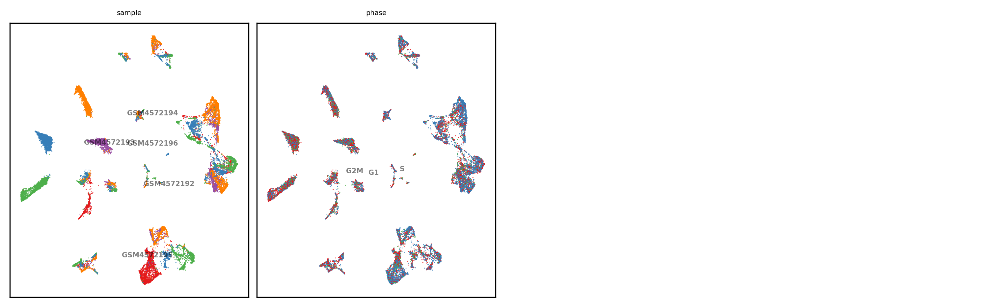

In [12]:
show_basis = 'X_umap'
show_cols = ['sample', 'phase']

ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"wtbatch_{show_basis}_{file_suffix}.png"
)

### Concord

In [13]:
output_key = f'Concord_{file_suffix}'
feature_list = ccd.ul.select_features(adata, n_top_features=10000, flavor='seurat_v3')
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, 
                      domain_key='sample', 
                      latent_dim=32,
                      n_epochs=10,
                      augmentation_mask_prob = 0.3, 
                      clr_temperature = .5, # Check out advanced usage to learn what this parameter controls, 
                      use_decoder=True,
                      seed=seed, 
                      inplace=False, 
                      verbose=False, 
                      device=device,
                      save_dir=save_dir) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.encode_adata(input_layer_key='X_log1p', output_key=output_key)

# Save the latent embedding to a filem, so that it can be loaded later
ccd.ul.save_obsm_to_hdf5(cur_ccd.adata, save_dir / f"obsm_{file_suffix}.h5")
adata.obsm = cur_ccd.adata.obsm # If not inplace

Concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
p_intra_knn: 0.3


Epoch 0 Training: 419it [00:07, 58.00it/s, loss=3.58]
Epoch 9 Training: 100%|██████████| 419/419 [00:06<00:00, 60.54it/s, loss=3.36]


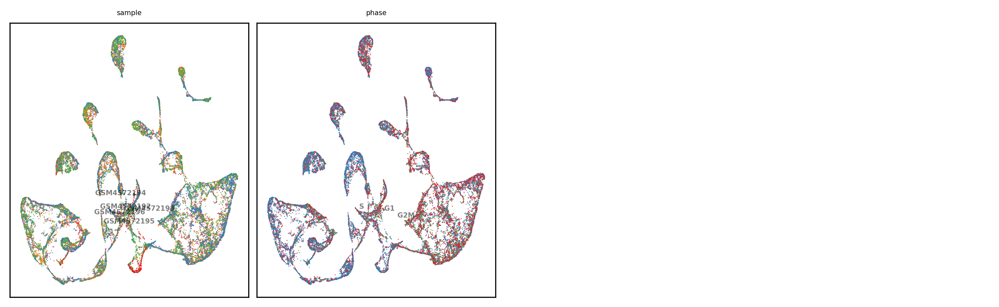

In [14]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
show_basis = f'{output_key}_UMAP'
show_cols = ['sample', 'phase']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=4, font_size=5, point_size=2, legend_loc='on data',
    save_path=save_dir / f"{show_basis}_{file_suffix}.png"
)

In [15]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
for col in show_cols:
    show_basis = f'{output_key}_UMAP_3D'
    ccd.pl.plot_embedding_3d(
            adata, basis=show_basis, color_by=col,
            save_path=save_dir / f'{show_basis}_{col}_{file_suffix}.html',
            point_size=1, opacity=0.8, width=1500, height=1000
        )

In [16]:

adata.write_h5ad(data_dir / f"adata_processed_{file_suffix}.h5ad")

file_suffix

'Dec05-0924'